#                                                **DEEP LEARNING PROJECT-2**


---







*   **NAVEEN BALARAJU**(UB:50251459)
*   **AVINASH KAMMARDI SASHIPRAKASH**(UB:50292823)





# **MULTIRES U-NET**

*   This Model is is taken from the paper MultiResUNet : Rethinking the U-Net Architecture for Multimodal Biomedical Image Segmentation, and reference to the paper can be found below.
*   The Author has replaced the Down sampling and Up sampling blocks by the residual blocks.The residual block consists of 3 convolution layers and number of filters in each convolution layer is controlled by a factor W as described in the paper.Also,the input is passed through a 1x1 filter and all the outputs are concatenated to produce the output for the Residual block.
*   The Author also proposes to a Residual path(Skip connection) that connects the Encoder and Decoder.Instead, of concatenating the Encoder feature maps directly to the Decoder, they have proposed to use a chain of convolutional layers with residual connections, and then concatenate with the decoder.We encourage you to read the paper for more deatiled understanding of how a Residual block and Residual path works.
*   The Skip connection is given in the following order.
1.   Residual block 1 --->Residual path ---> Residual block 8
2.   Residual block 2 --->Residual path ---> Residual block 7
3.   Residual block 3 --->Residual path ---> Residual block 6
4.   Residual block 4 --->Residual path ---> Residual block 5
*      ENCODER ----------> RESIDUAL PATH ---------> DECODER





#  REFERENCES

*   Paper1: https://arxiv.org/pdf/1902.04049.pdf
*   Paper2: https://arxiv.org/pdf/1906.03720.pdf
*   Image pre-processing: https://keras.io/preprocessing/image/
*   Data Augmentation: https://fairyonice.github.io/Learn-about-ImageDataGenerator.html
*   Dice Coefficient: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1415224/figure/F1/
*   Author Github link:https://github.com/nibtehaz/MultiResUNet


# DEPENDENT PACKAGES

In [0]:
from keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, add
from keras.models import Model, model_from_json
from keras.optimizers import Adam
from keras.layers.advanced_activations import LeakyReLU
from keras.utils.vis_utils import plot_model
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import cv2
from keras.optimizers import Adam
import pickle
import os
from keras import backend as K
from sklearn.model_selection import train_test_split
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from multiresunet_plain import MultiRes_Unet

# MOUNTING TO DRIVE

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
'''gpu_options = tf.GPUOptions(allow_growth=True)
session = tf.InteractiveSession(config=tf.ConfigProto(gpu_options=gpu_options))'''

# HYPERPARAMETERS

In [0]:
imagesize = 256
batch_size = 32
Optimizer = Adam(lr=1e-5)
epoch = 120

# LOADING AND PRE-PROCESSING DATASET

In [0]:
pk = open('Image.pickle','rb')
Final_image_data = pickle.load(pk)

m = open('Mask.pickle','rb')
Final_mask_data = pickle.load(m)

print(f'Shape of training images: {Final_image_data.shape}')
print(f'Shape of training mask: {Final_mask_data.shape}')

Shape of training images: (3929, 256, 256, 1)
Shape of training mask: (3929, 256, 256, 1)


In [0]:
# Normalizing the Data

Final_image_data = Final_image_data/255.0
Final_mask_data = Final_mask_data/255.0

# Splitting The dataset

Training_images,Validation_images,Training_mask,Validation_masks = train_test_split(Final_image_data,Final_mask_data,test_size=0.15,random_state=42)
del(Final_image_data)
del(Final_mask_data)
Validation_images,Test_images,Validation_masks,Test_masks = train_test_split(Validation_images,Validation_masks,test_size=0.15,random_state=42)


print(f'Training Images shape:{Training_images.shape}')
print(f'Training Mask shape:{Training_mask.shape}')
print(f'Validation Images shape:{Validation_images.shape}')
print(f'Validation Mask shape:{Validation_masks.shape}')
print(f'Test Images shape:{Test_images.shape}')
print(f'Test Mask shape:{Test_masks.shape}')

Training Images shape:(3339, 256, 256, 1)
Training Mask shape:(3339, 256, 256, 1)
Validation Images shape:(501, 256, 256, 1)
Validation Mask shape:(501, 256, 256, 1)
Test Images shape:(89, 256, 256, 1)
Test Mask shape:(89, 256, 256, 1)


# DATA AUGMENTATION

In [0]:

data_gen_args = dict(rotation_range=45,width_shift_range=0.1,height_shift_range=0.1,zoom_range=0.2)
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)


seed = 6
batch_size = 32



image_generator = image_datagen.flow(Training_images,seed=seed,batch_size=batch_size,shuffle = True)
mask_generator = mask_datagen.flow(Training_mask,seed=seed,batch_size=batch_size,shuffle = True)


# combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)

# LOSS FUNCTION

In [0]:
smooth = 1.0
def dice_coef(y_true, y_pred):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
  return -dice_coef(y_true, y_pred)

# MULTIRES U-NET MODEL

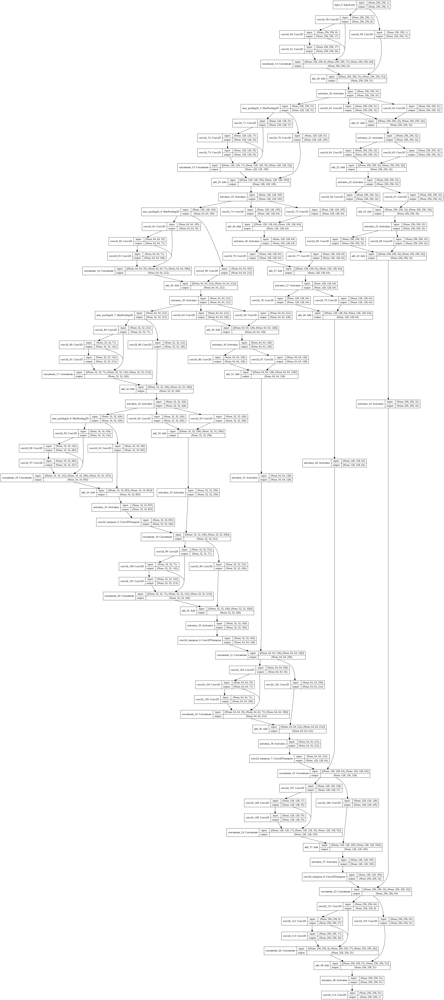

In [0]:
Unet = MultiRes_Unet()
plot_model(Unet,show_shapes=True)

In [0]:
Unet.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d_59 (Conv2D)              (None, 256, 256, 8)  80          input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_60 (Conv2D)              (None, 256, 256, 17) 1241        conv2d_59[0][0]                  
__________________________________________________________________________________________________
conv2d_61 (Conv2D)              (None, 256, 256, 26) 4004        conv2d_60[0][0]                  
____________________________________________________________________________________________

# **TRAINING MULTIRES U-NET MODEL**




In [0]:
Unet.compile(optimizer=Optimizer,loss=dice_coef_loss,metrics=[dice_coef])

In [0]:
Unet_training = Unet.fit_generator(train_generator,steps_per_epoch=(len(Training_images)//batch_size),epochs=epoch,verbose = 1,validation_data=(Validation_images,Validation_masks))

# Saving the trained MultiRes Unet model
path_save_model = '/content/drive/My Drive/Colab Notebooks/Deep learning- project 2/Paper_model_MultireUnet'
Unet.save(os.path.join(path_save_model,"Multires_Unet_trained_model_with_dataaug_120epoch.h5"))
print('Successfuly saved the trained Unet model into the Drive..!!!!!!!')




Epoch 1/120


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:716: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:724: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '







104/104 [==============================] - 94s 908ms/step - loss: -0.0230 - dice_coef: 0.0230 - val_loss: -0.0203 - val_dice_coef: 0.0203
Epoch 2/120
104/104 [==============================] - 78s 751ms/step - loss: -0.0274 - dice_coef: 0.0274 - val_loss: -0.0251 - val_dice_coef: 0.0251
Epoch 3/120
104/104 [==============================] - 76s 728ms/step - loss: -0.0316 - dice_coef: 0.0316 - val_loss: -0.0285 - val_dice_coef: 0.0285
Epoch 4/120
104/104 [==============================] - 76s 726ms/step - loss: -0.1540 - dice_coef: 0.1540 - val_loss: -0.2998 - val_dice_coef: 0.2998
Epoch 5/120
104/104 [==============================] - 76s 727ms/step - loss: -0.2710 - dice_coef: 0.2710 - val_loss: -0.3043 - val_dice_coef: 0.3043
Epoch 6/120
104/104 [==============================] - 76s 727ms/step - loss: -0.2927 - dice_coef: 0.2927 - val_loss: -0.3219 - val_dice_coef: 0.3219
Epoch 7/120
104/104 [==============================] - 76s 727ms/step - loss: -0.2897 - dice_coef: 0.2897 -

# METRICS AND LOSS PLOTS

In [0]:
train_dice_coef = Unet_training.history['dice_coef']
train_loss = Unet_training.history['loss']

validation_dice_coef = Unet_training.history['val_dice_coef']
validation_loss = Unet_training.history['val_loss']
Number_of_epochs = range(len(train_dice_coef))


i = open('train_dice_coef.pickle','wb')
pickle.dump(train_dice_coef,i)
i.close()

i = open('train_loss.pickle','wb')
pickle.dump(train_loss,i)
i.close()

i = open('validation_dice_coef.pickle','wb')
pickle.dump(validation_dice_coef,i)
i.close()


i = open('validation_loss.pickle','wb')
pickle.dump(validation_loss,i)
i.close()

i = open('Number_of_epochs.pickle','wb')
pickle.dump(Number_of_epochs,i)
i.close()

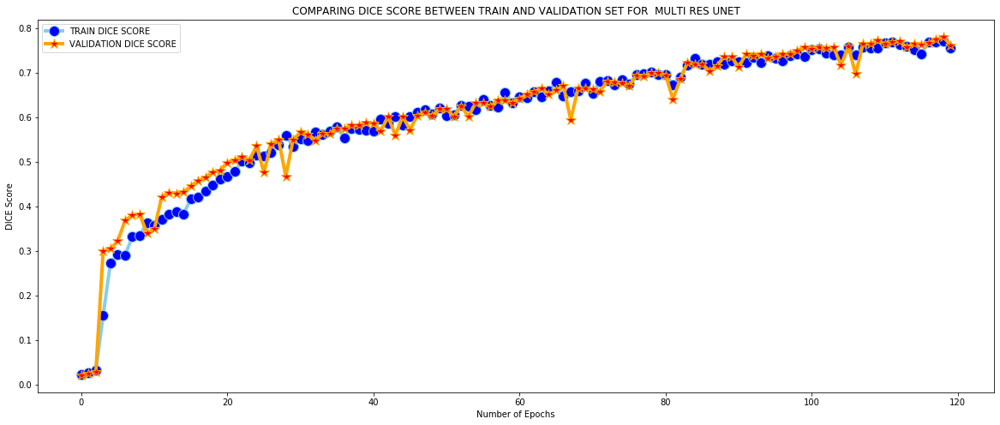

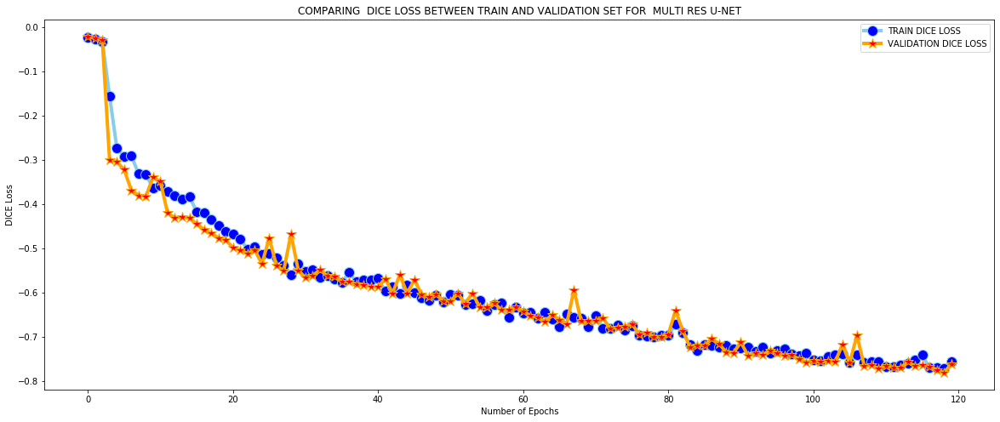

In [0]:
plt.figure(figsize=(20,8))
plt.title('COMPARING DICE SCORE BETWEEN TRAIN AND VALIDATION SET FOR  MULTI RES UNET')
plt.plot(Number_of_epochs,train_dice_coef,marker='o',markerfacecolor='blue',markersize=12,color='skyblue',linewidth=4,label='TRAIN DICE SCORE')
plt.plot(Number_of_epochs,validation_dice_coef,marker='*',markerfacecolor='red',markersize=12,color='orange',linewidth=4,label='VALIDATION DICE SCORE')
plt.xlabel('Number of Epochs')
plt.ylabel('DICE Score')
plt.legend()
plt.savefig('Dice_score.png')
plt.show()



plt.figure(figsize=(20,8))
plt.title('COMPARING  DICE LOSS BETWEEN TRAIN AND VALIDATION SET FOR  MULTI RES U-NET')
plt.plot(Number_of_epochs,train_loss,marker='o',markerfacecolor='blue',markersize=12,color='skyblue',linewidth=4,label='TRAIN DICE LOSS')
plt.plot(Number_of_epochs,validation_loss,marker='*',markerfacecolor='red',markersize=12,color='orange',linewidth=4,label='VALIDATION DICE LOSS')
plt.xlabel('Number of Epochs')
plt.ylabel('DICE Loss')
plt.legend()
plt.savefig('Dice_loss.png')
plt.show()

# EVALUATING MULTIRES U-NET MODEL PERFORMANCE ON TEST DATA

In [0]:
saved_unet_model = load_model("Multires_Unet_trained_model_with_dataaug_120epoch.h5",custom_objects={'dice_coef_loss': dice_coef_loss,'dice_coef':dice_coef})

In [0]:
pred = saved_unet_model.predict(Test_images,verbose=1)

89/89 [==============================] - 3s 32ms/step


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


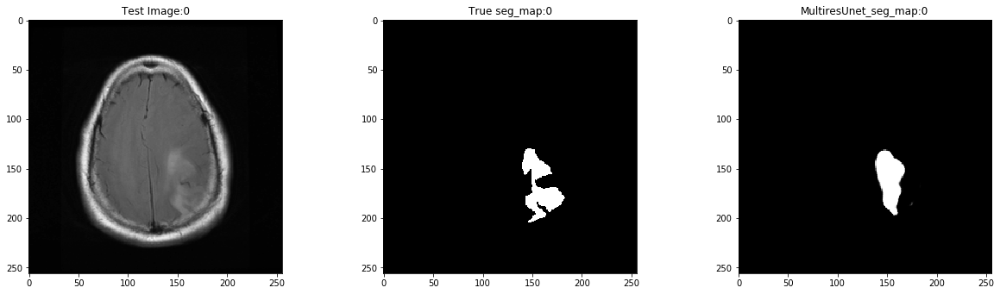

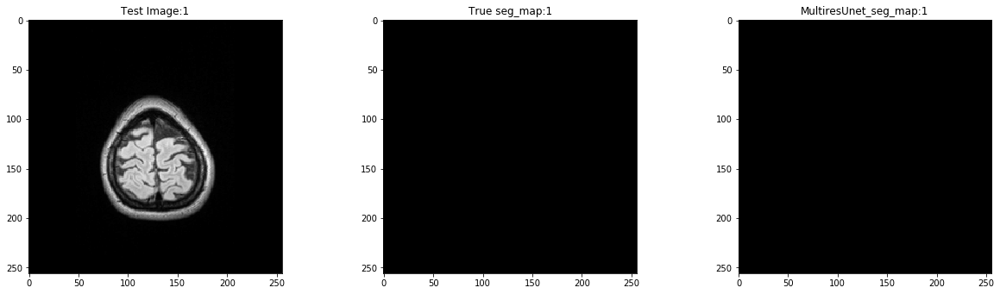

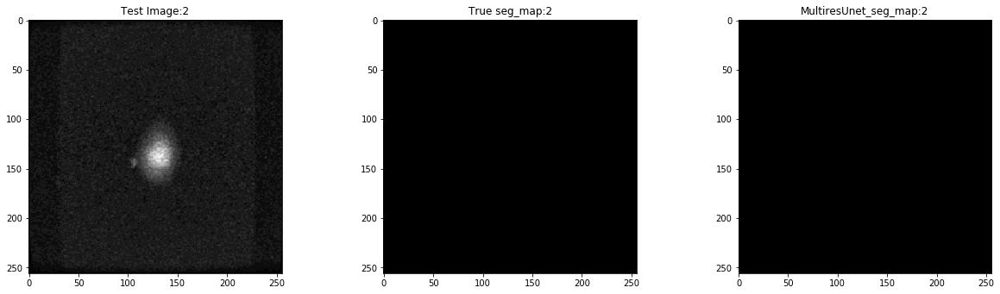

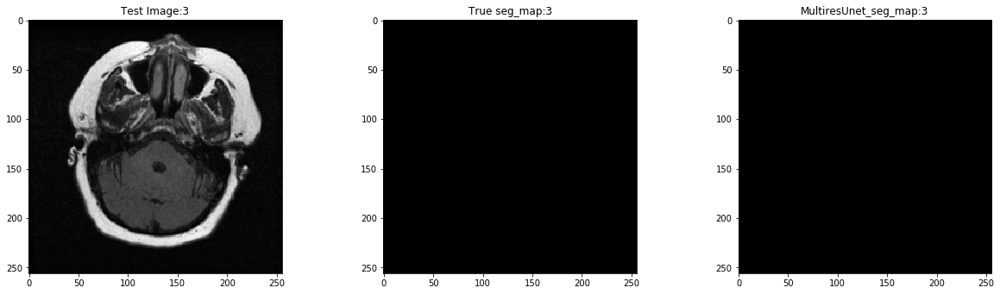

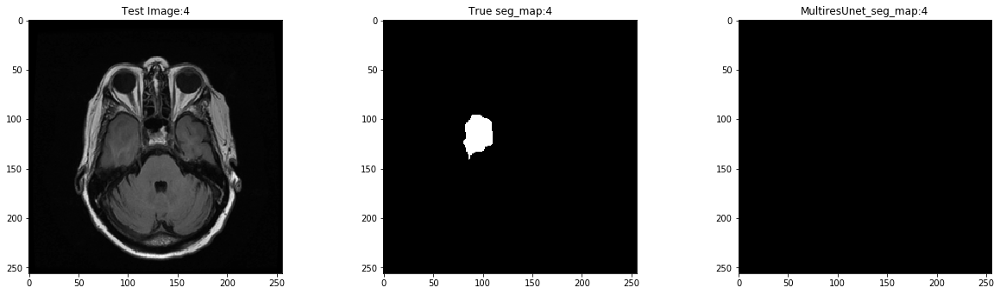

...

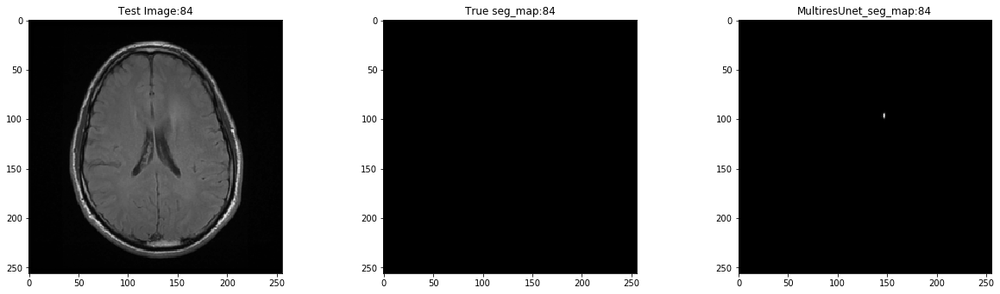

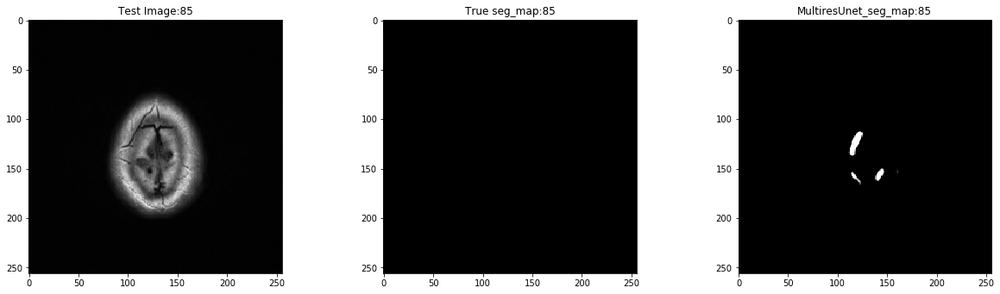

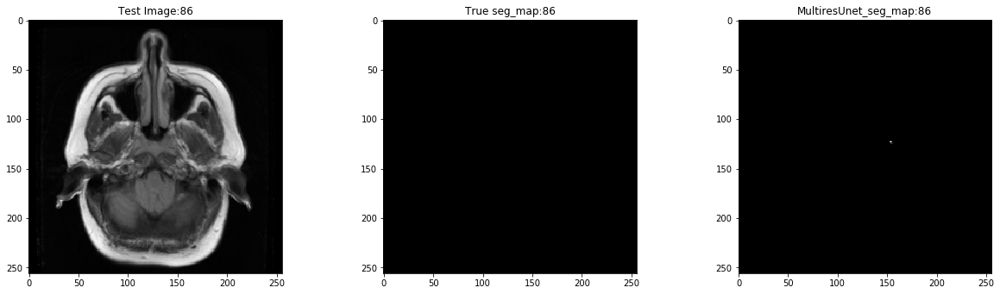

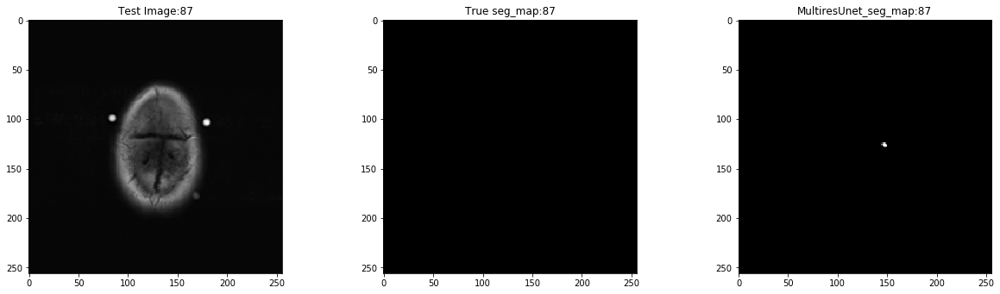

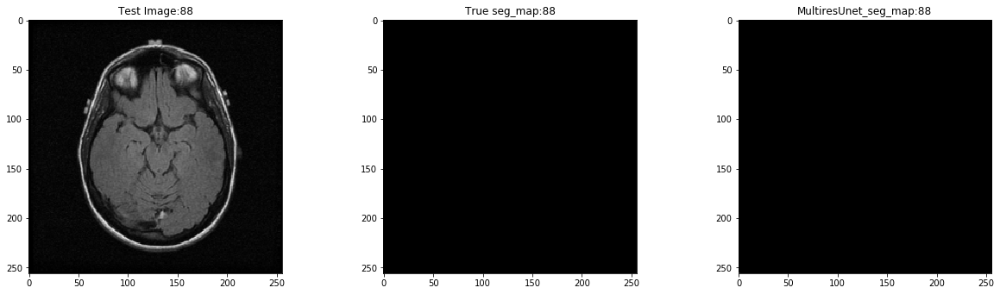

In [0]:
for i in range(len(pred)):
  fig = plt.figure(figsize=(20,15))
  fig.subplots_adjust(hspace=0.6, wspace=0.4)

  ax = fig.add_subplot(1, 3, 1)
  plt.title(f'Test Image:{i}')
  ax.imshow(np.reshape(Test_images[i]*255, (imagesize,imagesize)), cmap="gray")

  ax = fig.add_subplot(1, 3, 2)
  plt.title(f'True seg_map:{i}')
  ax.imshow(np.reshape(Test_masks[i]*255, (imagesize,imagesize)), cmap="gray")

  ax = fig.add_subplot(1, 3, 3)
  plt.title(f'MultiresUnet_seg_map:{i}')
  ax.imshow(np.reshape(pred[i]*255, (imagesize,imagesize)), cmap="gray")
